# Predicting countries' covid indicators using LSTM RNNs
Includes preprocessing data from ourworldindata, design and training of an LSTM RNN using tf.keras, and visualization of predicted results. The data is predicted based on 7-day rolling averages of new deaths and cases per million people, territory population and median age

Juan Andrés Toro
2021-04-27

# Setup

In [1]:
#Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import plotly.graph_objects as go
import datetime
import os
import requests

# Data gathering
- Get countries' covid data from Our World in Data https://covid.ourworldindata.org/data/owid-covid-data.csv
- Get US state covid data from nytimes github https://raw.githubusercontent.com/nytimes/covid-19-data/master/rolling-averages/us-states.csv
- Gett US state populations and median age from wikipedia
- Concatenate all territory data to obtain a dataset of covid indicators for all relevant countries and US territories

In [3]:
# import covid csv from https://covid.ourworldindata.org/data/owid-covid-data.csv
url = 'https://covid.ourworldindata.org/data/owid-covid-data.csv'
r = requests.get(url, allow_redirects=True)
open("owid-covid-data.csv",'wb').write(r.content)
all_countries_df = pd.read_csv("owid-covid-data.csv")
all_countries_df = all_countries_df[['date','iso_code','new_cases_smoothed_per_million','new_deaths_smoothed_per_million','population','median_age']]
all_countries_df.columns = ['date','name','new_cases_smoothed_per_million','new_deaths_smoothed_per_million','population','median_age']
all_countries_df

,date,name,new_cases_smoothed_per_million,new_deaths_smoothed_per_million,population,median_age
0,2020-02-24,AFG,NaN,NaN,38928341.0,18.6
1,2020-02-25,AFG,NaN,NaN,38928341.0,18.6
2,2020-02-26,AFG,NaN,NaN,38928341.0,18.6
3,2020-02-27,AFG,NaN,NaN,38928341.0,18.6
4,2020-02-28,AFG,NaN,NaN,38928341.0,18.6
...,...,...,...,...,...,...
85371,2021-04-27,ZWE,2.778,0.106,14862927.0,19.6
85372,2021-04-28,ZWE,2.028,0.096,14862927.0,19.6
85373,2021-04-29,ZWE,2.086,0.115,14862927.0,19.6
85374,2021-04-30,ZWE,2.038,0.106,14862927.0,19.6


In [4]:
# import us states covid data
url = 'https://raw.githubusercontent.com/nytimes/covid-19-data/master/rolling-averages/us-states.csv'
r = requests.get(url, allow_redirects=True)
open("covid_us_states.csv",'wb').write(r.content)
us_states_covid_df = pd.read_csv("covid_us_states.csv")
us_states_covid_df = us_states_covid_df[['date','state','cases_avg','deaths_avg']]
us_states_covid_df.columns = ['date', 'name', 'new_cases_smoothed', 'new_deaths_smoothed']

# import us states population
us_states_pop_df = pd.read_html('https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population')[0]
us_states_pop_df = us_states_pop_df.iloc[:,[2,3]]
us_states_pop_df.columns = ['name', 'population']
us_states_pop_df['population'].replace( { '\[.*\]' : '' }, inplace= True, regex = True)
us_states_pop_df['population'].replace( { ',' : '' }, inplace= True, regex = True)
us_states_pop_df['population'] = us_states_pop_df['population'].astype(int)

# import us states median age
us_states_med_age_df = pd.read_html('https://en.wikipedia.org/wiki/List_of_U.S._states_and_territories_by_median_age')[0]
us_states_med_age_df = us_states_med_age_df.drop('Rank',axis=1)
us_states_med_age_df.columns = ['name', 'median_age']
us_states_med_age_df['name'].replace( { '\[.\]' : '' }, inplace= True, regex = True)

# join tables
us_states_df = us_states_covid_df.merge(us_states_pop_df, on='name').merge(us_states_med_age_df, on='name')
us_states_df['new_cases_smoothed_per_million'] = us_states_df['new_cases_smoothed']/us_states_df['population']*1e6
us_states_df['new_deaths_smoothed_per_million'] = us_states_df['new_deaths_smoothed']/us_states_df['population']*1e6
us_states_df = us_states_df[['date','name','new_cases_smoothed_per_million','new_deaths_smoothed_per_million','population','median_age']]
us_states_df

,date,name,new_cases_smoothed_per_million,new_deaths_smoothed_per_million,population,median_age
0,2020-01-21,Washington,0.018169,0.0,7705281,37.8
1,2020-01-22,Washington,0.018169,0.0,7705281,37.8
2,2020-01-23,Washington,0.018169,0.0,7705281,37.8
3,2020-01-24,Washington,0.018169,0.0,7705281,37.8
4,2020-01-25,Washington,0.018169,0.0,7705281,37.8
...,...,...,...,...,...,...
22970,2021-04-27,Northern Mariana Islands,5.638403,0.0,51433,32.8
22971,2021-04-28,Northern Mariana Islands,5.638403,0.0,51433,32.8
22972,2021-04-29,Northern Mariana Islands,5.638403,0.0,51433,32.8
22973,2021-04-30,Northern Mariana Islands,5.638403,0.0,51433,32.8


In [5]:
# concatenate world and US datasets
all_territories_dataset = pd.concat([all_countries_df,us_states_df]).reset_index(drop=True)
all_territories_dataset

,date,name,new_cases_smoothed_per_million,new_deaths_smoothed_per_million,population,median_age
0,2020-02-24,AFG,NaN,NaN,38928341.0,18.6
1,2020-02-25,AFG,NaN,NaN,38928341.0,18.6
2,2020-02-26,AFG,NaN,NaN,38928341.0,18.6
3,2020-02-27,AFG,NaN,NaN,38928341.0,18.6
4,2020-02-28,AFG,NaN,NaN,38928341.0,18.6
...,...,...,...,...,...,...
108346,2021-04-27,Northern Mariana Islands,5.638403,0.0,51433.0,32.8
108347,2021-04-28,Northern Mariana Islands,5.638403,0.0,51433.0,32.8
108348,2021-04-29,Northern Mariana Islands,5.638403,0.0,51433.0,32.8
108349,2021-04-30,Northern Mariana Islands,5.638403,0.0,51433.0,32.8


# Data exploration
- Examine columns and their respective NA value percentage
- Plot histograms for numerical variables
- Plot scatter matrices to observe correlations

In [6]:
# get information about the dataset
all_territories_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108351 entries, 0 to 108350
Data columns (total 6 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   date                             108351 non-null  object 
 1   name                             108351 non-null  object 
 2   new_cases_smoothed_per_million   104798 non-null  float64
 3   new_deaths_smoothed_per_million  104798 non-null  float64
 4   population                       107801 non-null  float64
 5   median_age                       99867 non-null   float64
dtypes: float64(4), object(2)
memory usage: 5.0+ MB


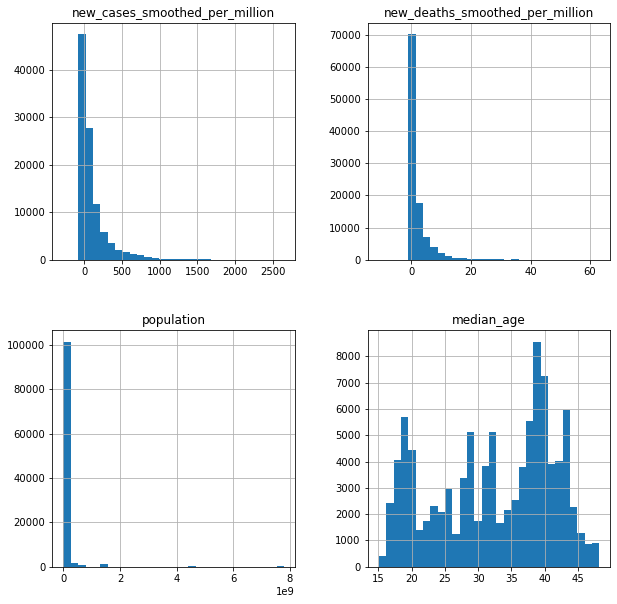

In [6]:
# plot histrogram for numerical values
all_territories_dataset.hist(bins=30, figsize=(10,10))
plt.show()

In [7]:
# get the amount of nan values per column
col_names=[]
na_count_percent=[]
for (col_name, col_data) in all_territories_dataset[all_territories_dataset['date']>='2020-05-01'].iteritems():
    col_names.append(col_name)
    na_count_percent.append(col_data.isna().sum()/len(all_territories_dataset)*100)

all_territories_nacount_df=pd.DataFrame(data={'column':col_names, 'na_count_percent':na_count_percent}).sort_values('na_count_percent').reset_index(drop=True)
all_territories_nacount_df

,column,na_count_percent
0,date,0.000000
1,name,0.000000
2,population,0.430781
3,new_cases_smoothed_per_million,1.794141
4,new_deaths_smoothed_per_million,1.794141
5,median_age,6.734570


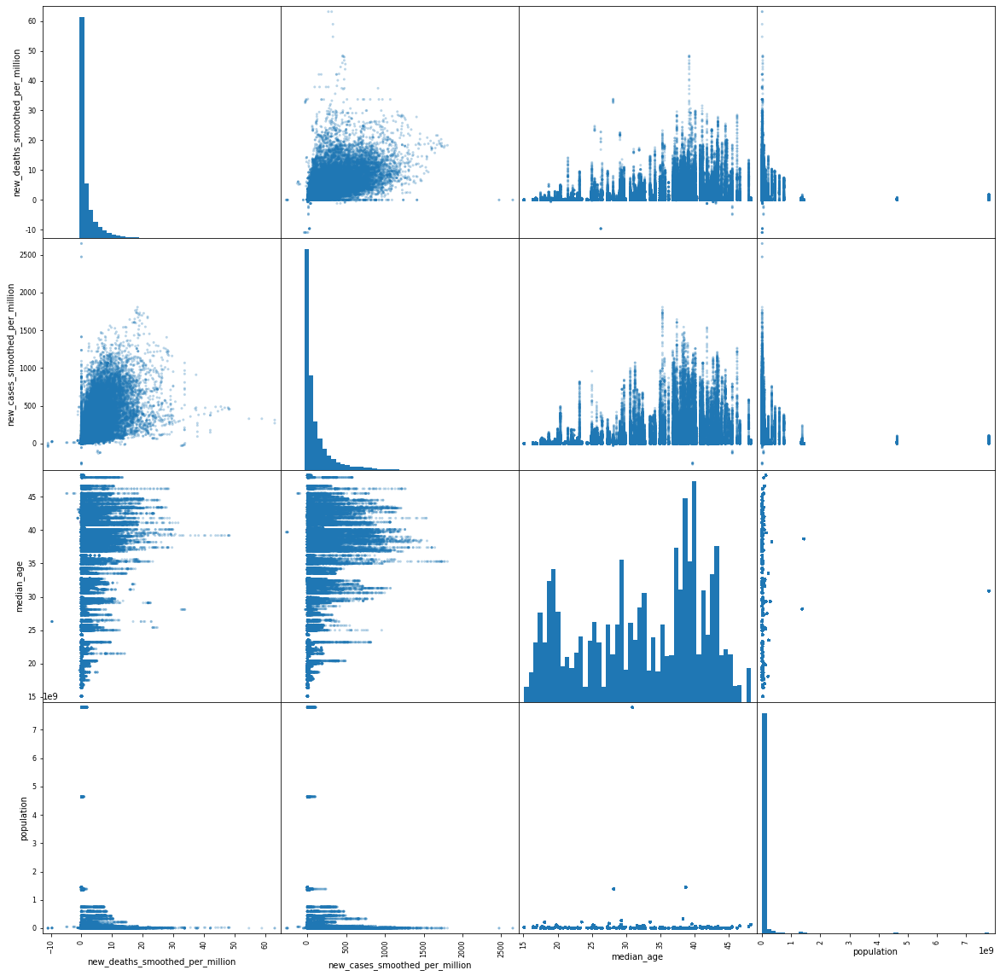

In [8]:
# Visualize data and correlations of most important features
pd.plotting.scatter_matrix(all_territories_dataset[['new_deaths_smoothed_per_million','new_cases_smoothed_per_million', 'median_age', 'population']], figsize=(20,20), alpha=0.3, hist_kwds=dict(bins=50))
plt.show()

# Data preprocessing
- Define relevant columns and specify sequential (date dependent) and non-sequential columns
- Target column is defined as new_deaths_smoothed_per_million in order to keep territories where there is enough relevant data
- Truncate the data so all data is from 2020-04-01 onwards
- Group by territory name, keep only those territories which fit certain conditions (same number of reports as the USA, less than 20% NaN values, less than 20% 0 deaths, has population and median age data, has at least 100 unique values reported for deaths)
- Preprocess territory data, scaling values and imputing NaNs
- Plot both cases and deaths for all territories selected
- Define preprocessing function for prediction


In [7]:
# build sklearn preprocess pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.impute import KNNImputer, SimpleImputer

feature_cols = ['new_deaths_smoothed_per_million', 'new_cases_smoothed_per_million', 'median_age', 'population']
non_sequential_cols = ['median_age', 'population']
target_col = 'new_deaths_smoothed_per_million'
relevant_cols = ['name', 'date'] + feature_cols

# Truncate the data from 2020-04-01 onwards
all_territories_dataset_datebound = all_territories_dataset[all_territories_dataset['date'] >= '2020-04-01']

# Number of reports from the USA, used as reference since it has reports for every day
row_count_usa = all_territories_dataset_datebound[all_territories_dataset_datebound['name']=='USA']['name'].count()

# Separate out territories, keep only those with fewer than 20% NaNs or 20% zeros, no NaNs in non sequential columns,
# same amount of reports as the USA, and at least 100 unique values reported fot deaths
territories_dfs = [
    x.reset_index(drop=True).reset_index()
    for _, x in all_territories_dataset_datebound[relevant_cols].groupby('name')
    if  (len(x)==row_count_usa)
    and (x[target_col].isna().sum() < len(x)*0.2) 
    and (x[target_col][x[target_col] == 0].count() < len(x)*0.2)
    and not np.any(x[non_sequential_cols].isna().to_numpy().reshape(-1)) 
    and (len(x[target_col].unique()) > 100)
]


# Preprocess territory dataframe function, std scale sequential features individually for each country,
# globally for non sequential features
# impute NaNs with simpleimputer for non-sequential, knnimputer for sequential features
def preprocess_territory_df(territory_df,
                          target_col=target_col,
                          feature_cols=feature_cols,
                          relevant_cols=relevant_cols,
                          non_sequential_cols=non_sequential_cols):
    stdscaler = StandardScaler(with_mean=True)
    knnimputer = KNNImputer(n_neighbors=4, weights='distance')
    simpleimputer = SimpleImputer(strategy='median')
    for col in feature_cols:
        if col in non_sequential_cols:
            stdscaler.fit(all_territories_dataset[col].to_numpy().reshape(-1, 1))
            territory_df[col] = stdscaler.transform(territory_df[col].to_numpy().reshape(-1, 1))
            territory_df[col] = simpleimputer.fit_transform(territory_df[col].to_numpy().reshape(-1, 1))
        else:
            territory_df[col] = np.clip(territory_df[col].to_numpy(),0,None)
            territory_df[col] = stdscaler.fit_transform(territory_df[col].to_numpy().reshape(-1, 1))
            territory_df[col] = knnimputer.fit_transform(territory_df[['index']+[col]].to_numpy().reshape(-1, 2))[:,1]
    return territory_df


# Preprocess all territories
territories_scaled_dfs = [preprocess_territory_df(x) for x in territories_dfs]

# Plot scaled new_deaths_smoothed_per_million by countries
fig = go.Figure()

for i in range(len(territories_scaled_dfs)):
    fig.add_trace(
        go.Scatter(x=territories_scaled_dfs[i]['date'],
                   y=territories_scaled_dfs[i]['new_deaths_smoothed_per_million'],
                   name=territories_scaled_dfs[i]['name'].iloc[0]))

fig.update_layout(
    title=f'new_deaths_smoothed_per_million for {len(territories_scaled_dfs)} individual territories',
    xaxis_title='date',
    yaxis_title='new_deaths_smoothed_per_million',
)
fig.show()

# Plot scaled new_cases_smoothed_per_million by countries
fig = go.Figure()

for i in range(len(territories_scaled_dfs)):
    fig.add_trace(
        go.Scatter(x=territories_scaled_dfs[i]['date'],
                   y=territories_scaled_dfs[i]['new_cases_smoothed_per_million'],
                   name=territories_scaled_dfs[i]['name'].iloc[0]))

fig.update_layout(
    title=f'new_cases_smoothed_per_million for {len(territories_scaled_dfs)} individual territories',
    xaxis_title='date',
    yaxis_title='new_cases_smoothed_per_million',
)
fig.show()

In [8]:
# Preprocessing function for prediction
def preprocess_prediction(name, df=territories_scaled_dfs):
    for t in df:
        if t['name'].iloc[0] == name:
            return  t[feature_cols].to_numpy().reshape(1,-1,len(feature_cols)), t['date'].to_numpy()

# Window based LSTM 
- Concatenate all territories and generate train, validation, and test sequences using Keras' TimeSeriesGenerator
- Select number of days to look back
- Train two layer LSTM network
- Evaluate model loss on train, validation, and test datasets

In [9]:
# convert territories_scaled_dfs into numpy array
territories_scaled_np_concat = np.array([x[feature_cols].to_numpy() for x in territories_scaled_dfs])
np.random.shuffle(territories_scaled_np_concat)
territories_scaled_np_concat = territories_scaled_np_concat.reshape(-1,len(feature_cols))

# choose look_back days
look_back = 30

val_size = 0.1
test_size = 0.1

train_sequence = keras.preprocessing.sequence.TimeseriesGenerator(
    territories_scaled_np_concat,
    territories_scaled_np_concat[:,[0,1]],
    length=look_back,
    batch_size = 32,
    end_index=int(territories_scaled_np_concat.shape[0]*(1-test_size-val_size)),
    shuffle=True,
)

val_sequence = keras.preprocessing.sequence.TimeseriesGenerator(
    territories_scaled_np_concat,
    territories_scaled_np_concat[:,[0,1]],
    length=look_back,
    batch_size = 16,
    start_index=int(territories_scaled_np_concat.shape[0]*(1-test_size-val_size)),
    end_index=int(territories_scaled_np_concat.shape[0]*(1-test_size)),
    shuffle=True,
)

test_sequence = keras.preprocessing.sequence.TimeseriesGenerator(
    territories_scaled_np_concat,
    territories_scaled_np_concat[:,[0,1]],
    length=look_back,
    batch_size = 16,
    start_index=int(territories_scaled_np_concat.shape[0]*(1-test_size)),
    shuffle=True,
)


In [24]:
#RNN architecture and training
if os.path.exists('window_lstm'):
    model = keras.models.load_model('window_lstm')

else:
    model=keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True),
        keras.layers.LSTM(50),
        keras.layers.Dense(2)
    ])

In [ ]:
#If you loaded the model you don't have to train it but you can if you want to
loss_func = keras.losses.Huber(delta=2)
model.compile(optimizer='adam', loss=loss_func)
history = model.fit(train_sequence,
                    validation_data=val_sequence,
                    epochs=1000,
                    callbacks=[
                        keras.callbacks.ReduceLROnPlateau(factor=0.5,patience=10),
                        keras.callbacks.EarlyStopping(patience=30, restore_best_weights=True)
                    ])

In [25]:
# Evaluate model loss for train, validation, and test sets (scores vary through prediction so an average of 10 evaluations
# is shown)

train_loss_list = [model.evaluate(train_sequence,verbose=False) for i in range(20)]
val_loss_list = [model.evaluate(val_sequence,verbose=False) for i in range(20)]
test_loss_list = [model.evaluate(test_sequence,verbose=False) for i in range(20)]

train_loss_mean, train_loss_std = (np.mean(train_loss_list), np.std(train_loss_list))
val_loss_mean, val_loss_std = (np.mean(val_loss_list), np.std(val_loss_list))
test_loss_mean, test_loss_std = (np.mean(test_loss_list), np.std(test_loss_list))

print(f'train_loss:\t{train_loss_mean:.5f} +- {train_loss_std:.5f}\nval_loss:\t{val_loss_mean:.5f} +- {val_loss_std:.5f}\ntest_loss:\t{test_loss_mean:.5f} +- {test_loss_std:.5f}')

train_loss:	0.01078 +- 0.00073
val_loss:	0.00908 +- 0.00150
test_loss:	0.00897 +- 0.00228


# Predictions
- Choose a territory name, n (days forward to predict), n_past (days in the past to predict in order to compare with real results)
- Choose a column to display (0=deaths, 1=cases)
- Plot predictions

In [26]:
# Predict n future intervals
territory_name = 'COL'
territory_pop = all_territories_dataset[all_territories_dataset['name']==territory_name]['population'].iloc[0]/1e6
n = 150
n_past = 100

covid_sequence, x_plot = preprocess_prediction(territory_name)
for i in range(n):
    preds_n = model.predict(covid_sequence[:,-look_back:,:])
    preds_n = np.append(preds_n,covid_sequence[0,0,2:]).reshape(1,1,len(feature_cols))
    covid_sequence = np.append(covid_sequence,preds_n,axis=1)

covid_sequence2, _ = preprocess_prediction(territory_name)
covid_sequence2 = covid_sequence2[:,:-n_past,:]
for i in range(n_past):
    preds_n = model.predict(covid_sequence2[:,-look_back:,:])
    preds_n = np.append(preds_n,covid_sequence[0,0,2:]).reshape(1,1,len(feature_cols))
    covid_sequence2 = np.append(covid_sequence2,preds_n,axis=1)

# Get date range (x_plot)
x_plot = np.append(x_plot, pd.date_range(start=x_plot[-1], periods=n, closed='right').strftime('%Y-%m-%d').to_numpy())

In [28]:
# Plot future predictions
col_idx = 1 #0=deaths, 1=cases
feature_names = ['deaths', 'cases']
stdscaler_col = StandardScaler()
stdscaler_col.fit(all_territories_dataset_datebound[all_territories_dataset_datebound['name']==territory_name][feature_cols[col_idx]].to_numpy().reshape(-1,1))
covid_sequence_target = stdscaler_col.inverse_transform(covid_sequence[:,:,col_idx].reshape(-1))*territory_pop
covid_sequence2_target = stdscaler_col.inverse_transform(covid_sequence2[:,:,col_idx].reshape(-1))*territory_pop


fig = go.Figure()
fig.add_trace(go.Scatter(x=x_plot[:-n+1], y=covid_sequence_target[:-n+1], name='real'))
fig.add_trace(go.Scatter(x=x_plot[-n:],y=covid_sequence_target[-n-1:], name='future projected'))
fig.add_trace(go.Scatter(x=x_plot[-n-n_past:],y=covid_sequence2_target[-n_past-1:], name='past projected'))
fig.update_layout(
      title = f'Window LSTM - predicted new {feature_names[col_idx]} for '+ territory_name + ' - looking back ' + str(look_back) + ' days',
      xaxis_title = 'date',
      yaxis_title = f'New {feature_names[col_idx]}',
)
fig.show()

In [29]:
# save model if its good
model.save('window_lstm')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: window_lstm\assets


# Predict colombian departments COVID-19 indicators
- Import data, preprocess it, choose territory name to predict and plot predictions

In [29]:
# Import colombia department data
col_dep_df = pd.read_csv('datos_col_departamento.csv')
col_dep_df['new_cases_per_millon'] = col_dep_df['new_cases']/col_dep_df['population']*1e6
col_dep_df['new_deaths_per_millon'] = col_dep_df['new_deaths']/col_dep_df['population']*1e6
col_dep_df['new_cases_smoothed_per_million'] = col_dep_df['new_cases_per_millon'].rolling(7).mean()
col_dep_df['new_deaths_smoothed_per_million'] = col_dep_df['new_deaths_per_millon'].rolling(7).mean()
col_dep_df = col_dep_df.rename(columns={'departamento':'name'})
col_dep_df = col_dep_df.drop('Unnamed: 0', axis=1)
col_dep_df

,date,name,new_cases,new_deaths,median_age,population,new_cases_per_millon,new_deaths_per_millon,new_cases_smoothed_per_million,new_deaths_smoothed_per_million
0,2020-04-17,AMAZONAS,1,NaN,31.3,79020,12.655024,NaN,NaN,NaN
1,2020-04-18,AMAZONAS,3,1.0,31.3,79020,37.965072,12.655024,NaN,NaN
2,2020-04-21,AMAZONAS,2,NaN,31.3,79020,25.310048,NaN,NaN,NaN
3,2020-04-23,AMAZONAS,6,1.0,31.3,79020,75.930144,12.655024,NaN,NaN
4,2020-04-24,AMAZONAS,2,1.0,31.3,79020,25.310048,12.655024,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
12080,2021-04-26,VICHADA,2,NaN,31.3,112958,17.705696,NaN,27.823236,NaN
12081,2021-04-27,VICHADA,3,NaN,31.3,112958,26.558544,NaN,30.352622,NaN
12082,2021-04-28,VICHADA,1,NaN,31.3,112958,8.852848,NaN,30.352622,NaN
12083,2021-04-30,VICHADA,11,NaN,31.3,112958,97.381328,NaN,30.352622,NaN


In [32]:
col_dep_df_datebound = col_dep_df.query("date >= '2020-06-01' and date <= '2021-05-01'")

department_dfs = [preprocess_territory_df(x.reset_index(drop=True).reset_index()) for _,x in col_dep_df_datebound.groupby('name') 
                  if not np.any(x[non_sequential_cols].isna().to_numpy().reshape(-1)) 
                  and ((len(x[target_col].unique())) > 50)]

In [33]:
# Predict n future intervals
dept_name = 'BOGOTA'
dept_pop = col_dep_df[col_dep_df['name']==dept_name]['population'].iloc[0]/1e6
n = look_back*5
n_past = int(look_back*3.4)

covid_sequence, x_plot = preprocess_prediction(dept_name, df=department_dfs)
for i in range(n):
    preds_n = model.predict(covid_sequence[:,-look_back:,:])
    preds_n = np.append(preds_n,covid_sequence[0,0,2:]).reshape(1,1,len(feature_cols))
    covid_sequence = np.append(covid_sequence,preds_n,axis=1)

covid_sequence2, _ = preprocess_prediction(dept_name, df=department_dfs)
covid_sequence2 = covid_sequence2[:,:-n_past,:]
for i in range(n_past):
    preds_n = model.predict(covid_sequence2[:,-look_back:,:])
    preds_n = np.append(preds_n,covid_sequence[0,0,2:]).reshape(1,1,len(feature_cols))
    covid_sequence2 = np.append(covid_sequence2,preds_n,axis=1)

# Get date range (x_plot)
x_plot = np.append(x_plot, pd.date_range(start=x_plot[-1], periods=n, closed='right').strftime('%Y-%m-%d').to_numpy())

In [36]:
# Plot future predictions
col_idx = 1 #0-deaths, 1-cases
feature_names = ['deaths', 'cases']
stdscaler_col = StandardScaler()
stdscaler_col.fit(col_dep_df_datebound[col_dep_df_datebound['name']==dept_name][feature_cols[col_idx]].to_numpy().reshape(-1,1))
covid_sequence_target = stdscaler_col.inverse_transform(covid_sequence[:,:,col_idx].reshape(-1))*dept_pop
covid_sequence2_target = stdscaler_col.inverse_transform(covid_sequence2[:,:,col_idx].reshape(-1))*dept_pop


fig = go.Figure()
fig.add_trace(go.Scatter(x=x_plot[:-n+1], y=covid_sequence_target[:-n+1], name='real'))
fig.add_trace(go.Scatter(x=x_plot[-n:],y=covid_sequence_target[-n-1:], name='future projected'))
fig.add_trace(go.Scatter(x=x_plot[-n-n_past:],y=covid_sequence2_target[-n_past-1:], name='past projected'))
fig.update_layout(
      title = f'Window LSTM - predicted new {feature_names[col_idx]} for '+ dept_name + ' - looking back ' + str(look_back) + ' days',
      xaxis_title = 'date',
      yaxis_title = f'New {feature_names[col_idx]}',
)
fig.show()